In [6]:
import pickle
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from read_write_bundles import *
import numpy as np

In [2]:
def print_image(objecte, name):
    path2 = "../whole_brain_MNI_100k_21p.bundles"
    whole_brain = read_bundle(path2)
    xline,yline,zline = [], [], []
    for i in whole_brain[0:10000]:
        x,y,z = [],[],[]
        for j in i:
            x.append(j[0])
            y.append(j[1])
            z.append(j[2])
        xline.append(x)
        yline.append(y)
        zline.append(z)

    xline2,yline2,zline2 = [], [], []
    for i in object_file:
        x,y,z = [],[],[]
        for j in i:
            x.append(j[0])
            y.append(j[1])
            z.append(j[2])
        xline2.append(x)
        yline2.append(y)
        zline2.append(z)

    fig = plt.figure(figsize=(30,20))
    ax = plt.axes(projection='3d')

    title = name.split('.')[0]
    plt.title(title)
    plt.show()

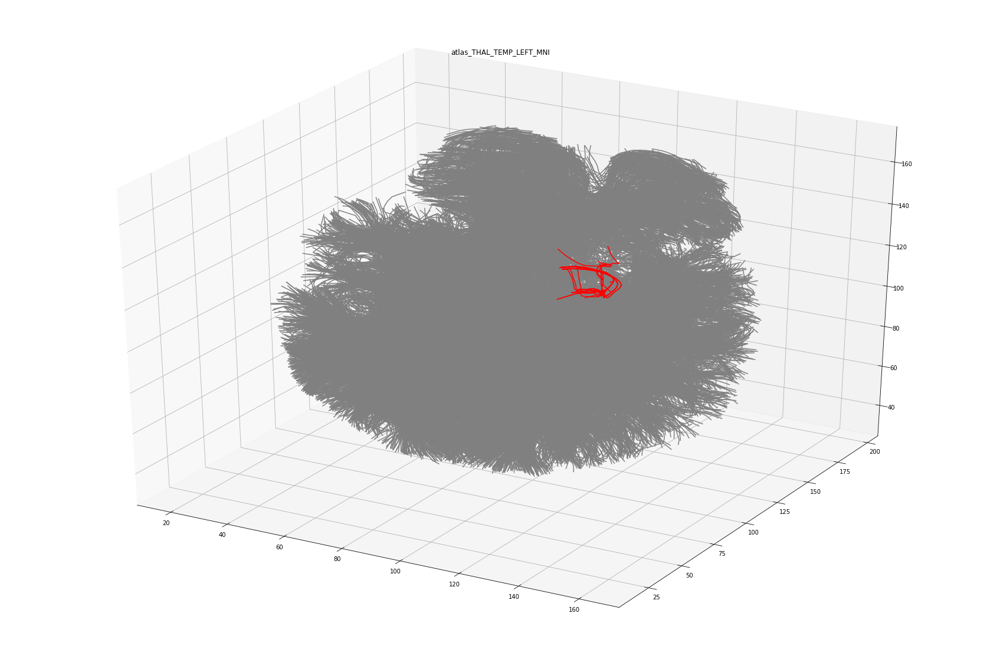

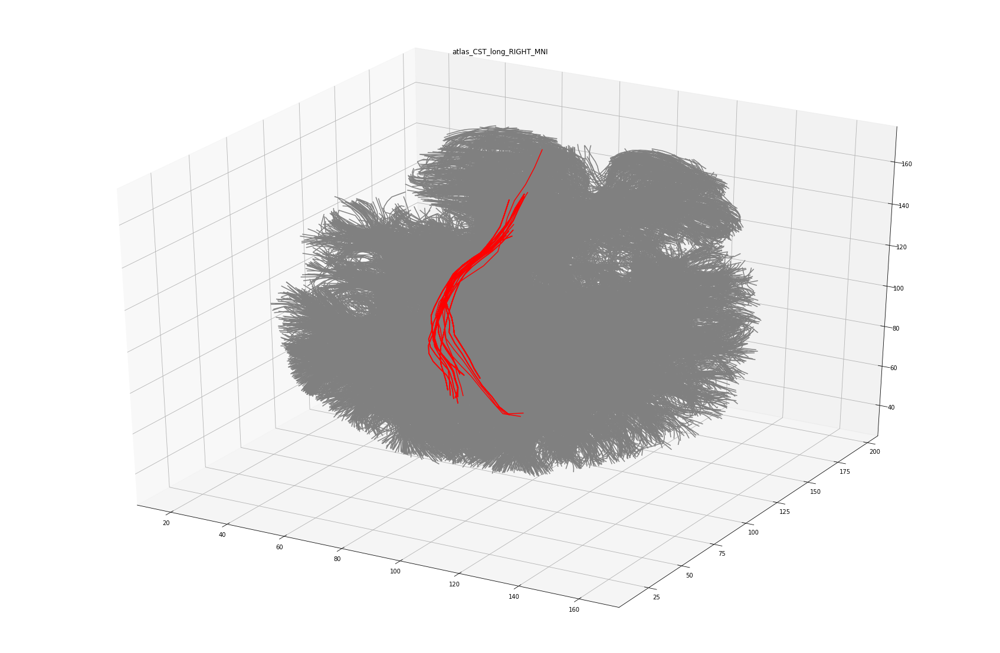

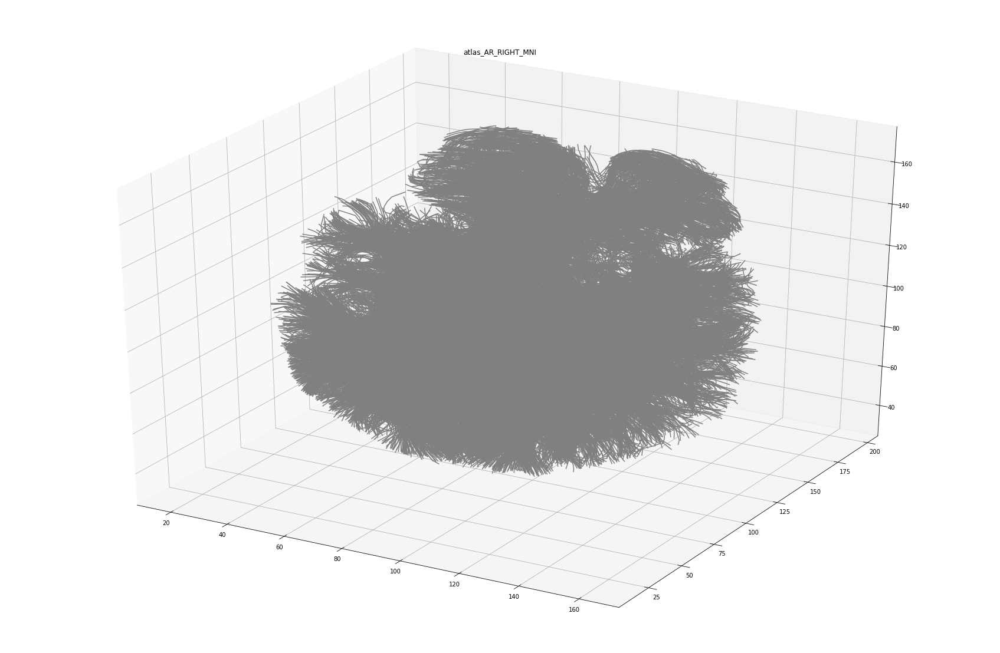

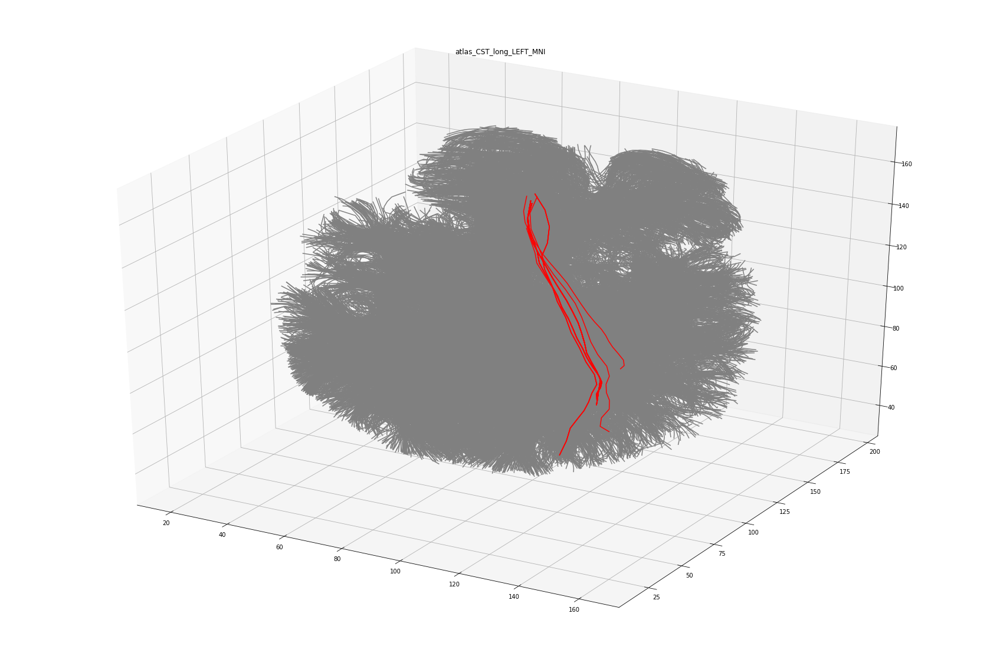

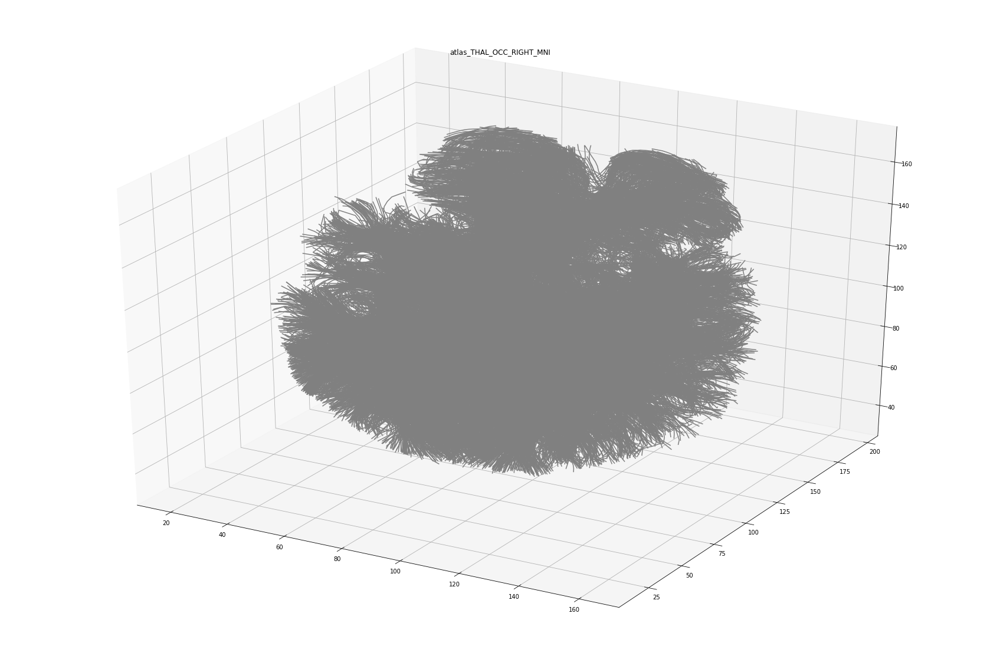

...

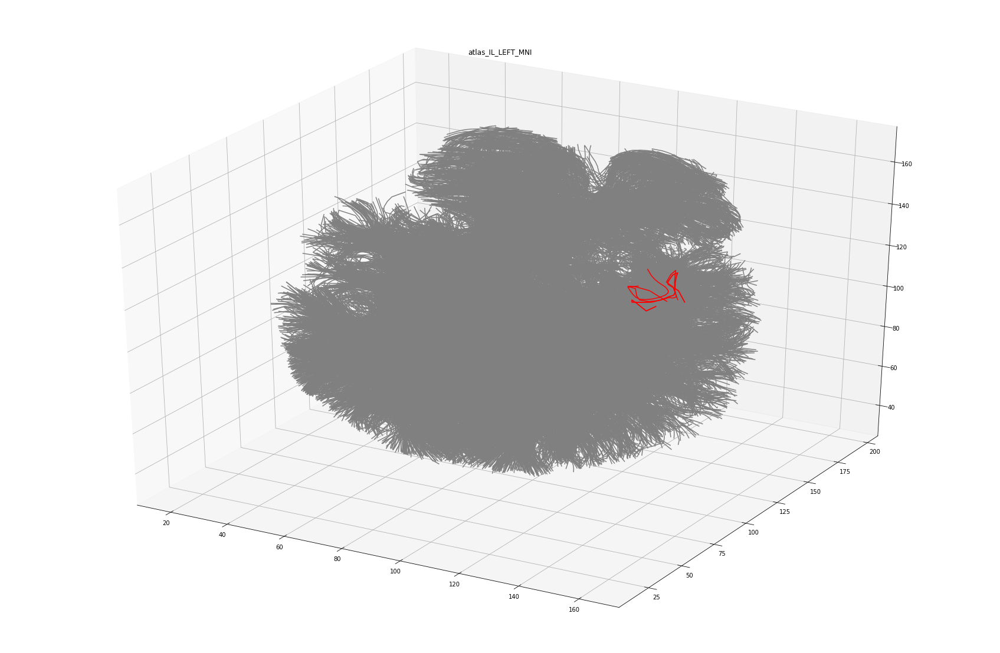

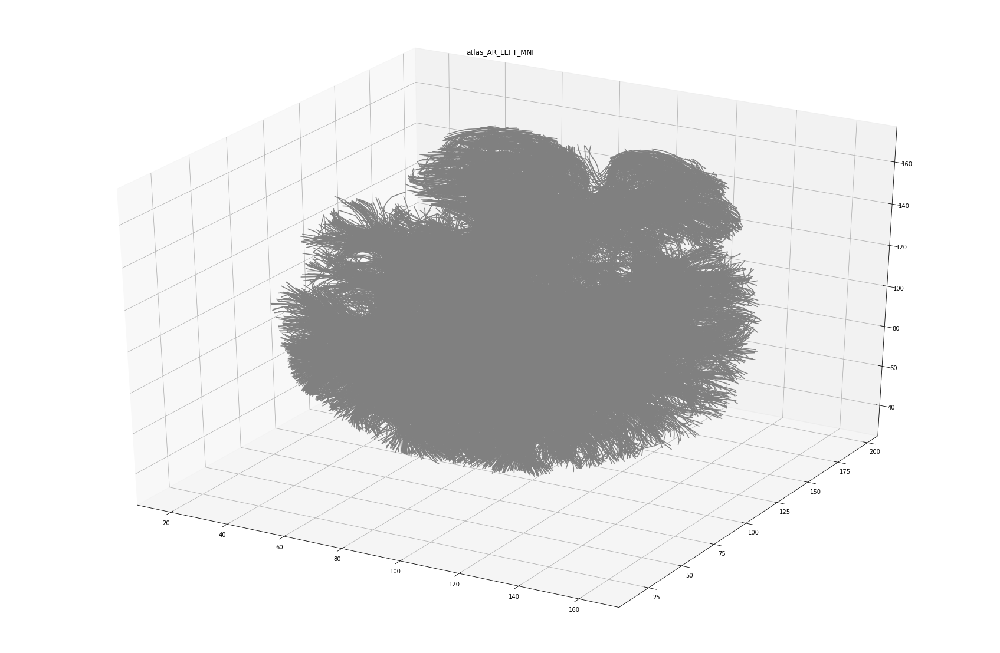

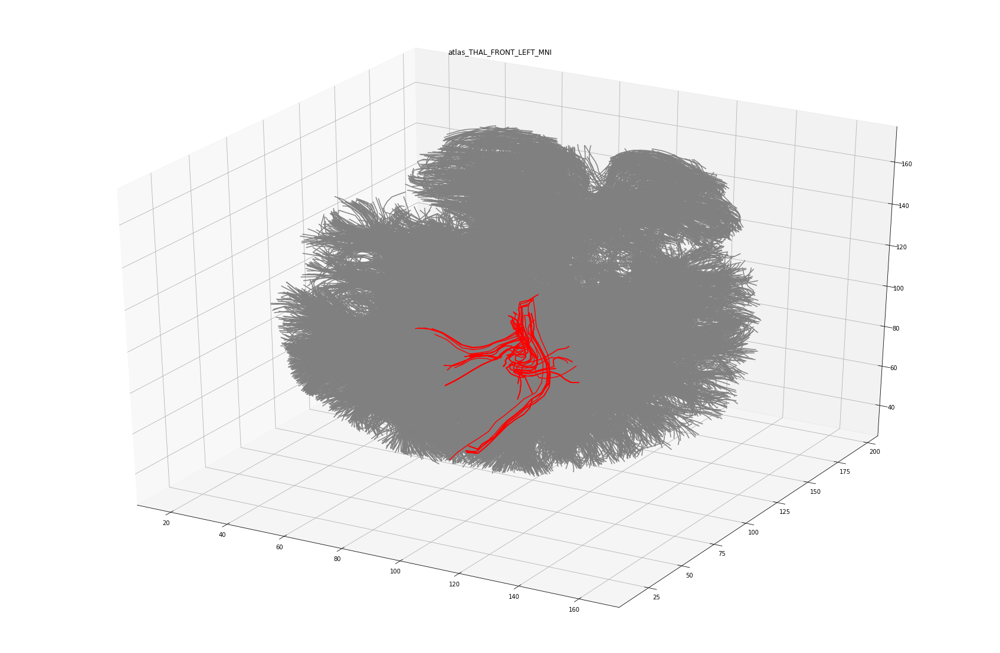

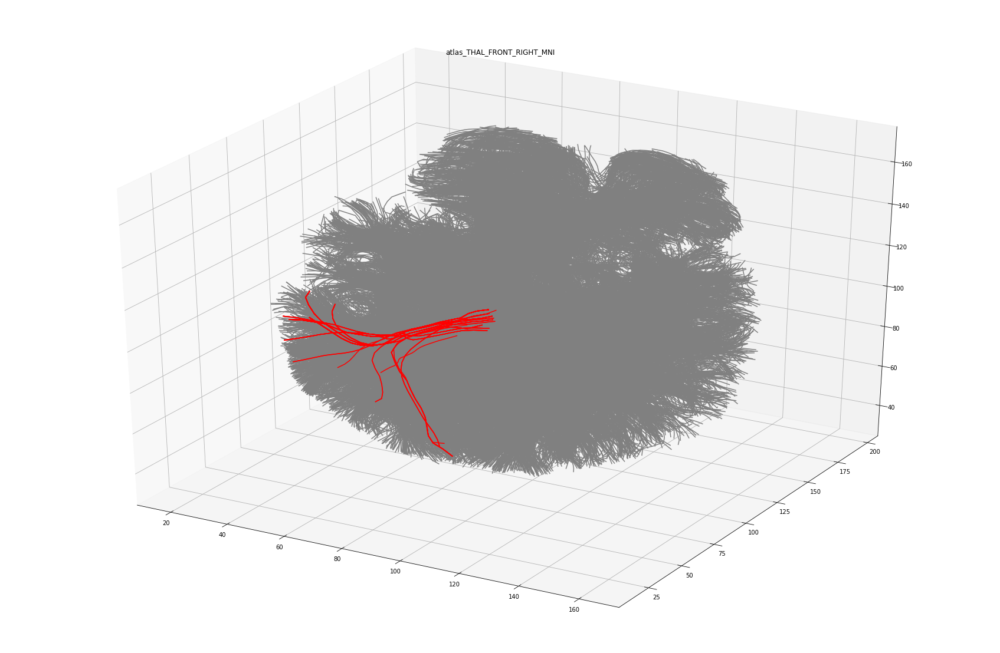

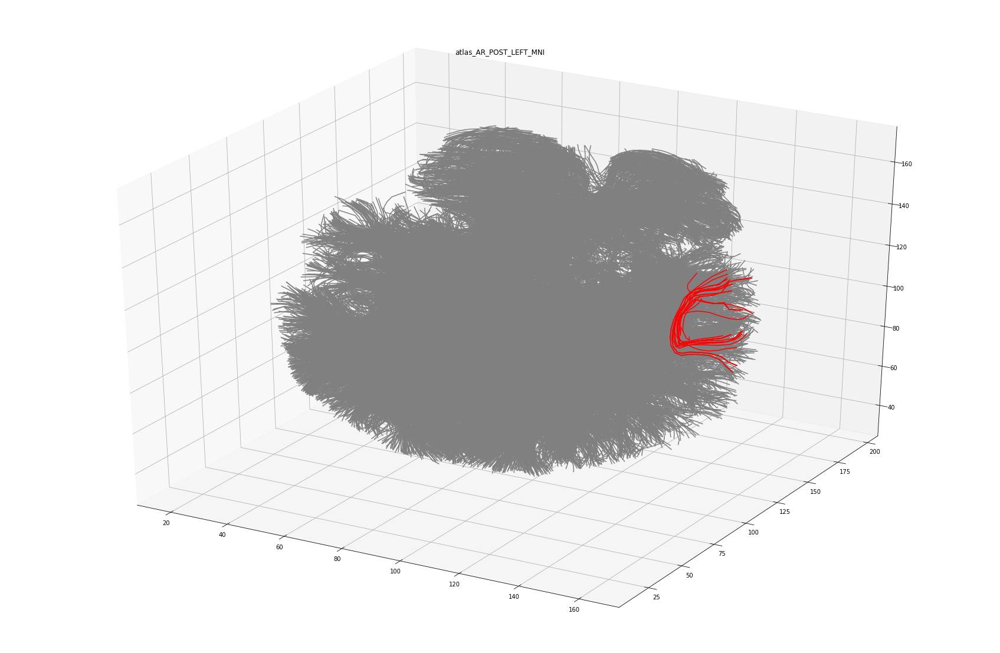

In [3]:
rootdir = '.'
extensions = ('bundles')
for subdir, dirs, files in os.walk(rootdir):
    for filex in files:
        try:
            ext = os.path.splitext(filex)[0].lower()
            ext = ext.split('.')[1]
            if ext in extensions:
                file = open(filex,'rb')
                object_file = pickle.load(file)
                print_image(object_file, filex)
        
        except:
            continue

In [24]:

from matplotlib import colors as mcolors


colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

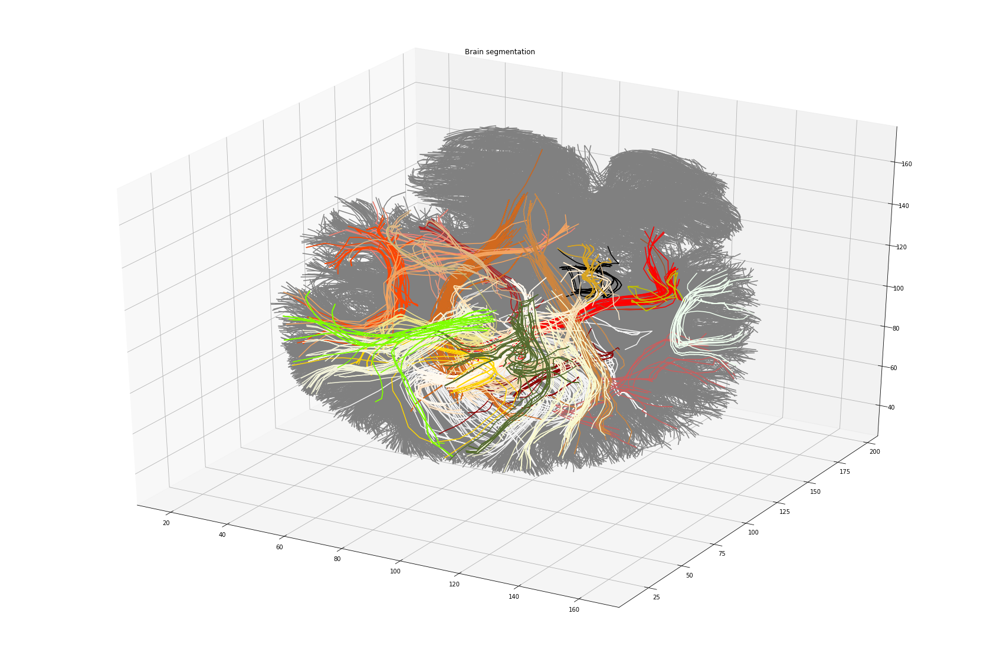

In [35]:
path2 = "../whole_brain_MNI_100k_21p.bundles"
whole_brain = read_bundle(path2)
xline,yline,zline = [], [], []
for i in whole_brain[0:10000]:
    x,y,z = [],[],[]
    for j in i:
        x.append(j[0])
        y.append(j[1])
        z.append(j[2])
    xline.append(x)
    yline.append(y)
    zline.append(z)

rootdir = '.'
extensions = ('bundles')
fig = plt.figure(figsize=(30,20))
ax = plt.axes(projection='3d')
for i,(x) in enumerate(xline):  
    ax.plot3D(xline[i], yline[i], zline[i],'gray')

ra = 0
for subdir, dirs, files in os.walk(rootdir):
    for filex in files:
        try:
            ext = os.path.splitext(filex)[0].lower()
            ext = ext.split('.')[1]
            if ext in extensions:
                file = open(filex,'rb')
                object_file = pickle.load(file)
                xline2,yline2,zline2 = [], [], []
                for i in object_file:
                    x,y,z = [],[],[]
                    for j in i:
                        x.append(j[0])
                        y.append(j[1])
                        z.append(j[2])
                    xline2.append(x)
                    yline2.append(y)
                    zline2.append(z)
                
                name = filex.split('.')[0]
                for i,(x) in enumerate(xline2):  
                    ax.plot3D(xline2[i], yline2[i], zline2[i], str(sorted_names[ra]))
                
                ra +=2
        except:
            continue

plt.title('Brain segmentation')
plt.show()